# Feature Extraction UDF Demo

### Launch EVA DB
Run the command `python eva.py` in the server where you want to deploy EVA

### Install Required Dependencies 

In [70]:
!pip install faiss-cpu --no-cache
!pip install seaborn

     |████████████████████████████████| 292 kB 4.1 MB/s eta 0:00:01     |████████████████████████████    | 256 kB 4.1 MB/s eta 0:00:01
     |████████████████████████████████| 11.2 MB 7.6 MB/s eta 0:00:01     |███▎                            | 1.1 MB 13.0 MB/s eta 0:00:01     |████████▌                       | 3.0 MB 13.0 MB/s eta 0:00:01     |███████████████████             | 6.7 MB 13.0 MB/s eta 0:00:01     |████████████████████            | 7.0 MB 7.6 MB/s eta 0:00:01     |██████████████████████▍         | 7.9 MB 7.6 MB/s eta 0:00:01     |███████████████████████▏        | 8.1 MB 7.6 MB/s eta 0:00:01     |███████████████████████▋        | 8.3 MB 7.6 MB/s eta 0:00:01     |██████████████████████████▏     | 9.2 MB 7.6 MB/s eta 0:00:01     |████████████████████████████▊   | 10.1 MB 7.6 MB/s eta 0:00:01
     |████████████████████████████████| 884 kB 10.1 MB/s eta 0:00:01
     |████████████████████████████████| 3.1 MB 9.6 MB/s eta 0:00:01     |██████████                      | 952 kB 9.6 MB

### Establish Connection With Eva DB

In [102]:
import sys
import numpy as np
import pandas as pd
import cv2
sys.path.insert(0,'..')
from src.server.db_api import connect

In [35]:
import nest_asyncio
nest_asyncio.apply()
connection = connect(host = '0.0.0.0', port = 5432) # hostname, port of the server where EVADB is running

In [36]:
cursor = connection.cursor()

### Upload the videos to analyse

In [46]:
cursor.execute('UPLOAD INFILE "../data/feature_extraction_demo/vid1.mp4" PATH "video1.mp4";')
response = cursor.fetch_all()
print(response)

Response Object:
@status: 0
@batch: Batch Object:
@dataframe: Empty DataFrame
Columns: []
Index: []
@batch_size: 0
@identifier_column: id
@metrics: None


In [47]:
cursor.execute('UPLOAD INFILE "../data/feature_extraction_demo/vid2.mp4" PATH "video2.mp4";')
response = cursor.fetch_all()
print(response)

Response Object:
@status: 0
@batch: Batch Object:
@dataframe: Empty DataFrame
Columns: []
Index: []
@batch_size: 0
@identifier_column: id
@metrics: None


### Visualize Videos

In [5]:
from ipywidgets import Video
Video.from_file("../data/feature_extraction_demo/vid1.mp4", embed=True)

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x19K[mdat\x00\x00\…

In [43]:
from ipywidgets import Video
Video.from_file("../data/feature_extraction_demo/vid2.mp4", embed=True)

Video(value=b'')

### Load video into EVA

In [48]:
cursor.execute('LOAD DATA INFILE "video1.mp4" INTO MyVideo1;')
response = cursor.fetch_all()
print(response)

Response Object:
@status: 0
@batch: Batch Object:
@dataframe:         Video  Num Loaded Frames
0  video1.mp4               1440
@batch_size: 1
@identifier_column: id
@metrics: None


In [49]:
cursor.execute('LOAD DATA INFILE "video2.mp4" INTO MyVideo2;')
response = cursor.fetch_all()
print(response)

Response Object:
@status: 0
@batch: Batch Object:
@dataframe:         Video  Num Loaded Frames
0  video2.mp4               1440
@batch_size: 1
@identifier_column: id
@metrics: None


### Register VGG16 Feature Extraction model into EVA

In [50]:
cursor.execute("""CREATE UDF IF NOT EXISTS VGG16FeatureExtractorUDF 
INPUT (frame NDARRAY UINT8(3, ANYDIM, ANYDIM)) 
OUTPUT (descriptors NDARRAY FLOAT32(ANYDIM)) 
TYPE Classification 
IMPL 'src/udfs/vgg16_feature_extractor.py';
      """)
response = cursor.fetch_all()
print(response)

Response Object:
@status: 0
@batch: Batch Object:
@dataframe: Empty DataFrame
Columns: []
Index: []
@batch_size: 0
@identifier_column: id
@metrics: None


### Run Feature Extractor on Videos

In [51]:
cursor.execute("""SELECT id, Unnest(VGG16FeatureExtractorUDF(data)) FROM MyVideo1 SAMPLE 150""")

# Store Video 1's results in a variable
response = cursor.fetch_all()

In [53]:
cursor.execute("""SELECT id, Unnest(VGG16FeatureExtractorUDF(data)) FROM MyVideo2 SAMPLE 150""")

# Store Video 2's results in a variable
response2 = cursor.fetch_all()

### Import Function for Comparing Feature Descriptors

In [67]:
import faiss

# coding=utf-8
# Copyright 2018-2020 EVA
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

from abc import ABCMeta, abstractmethod
import pandas as pd


class AbstractNdarrayUDF(metaclass=ABCMeta):
    """
    Abstract class for UDFs. All the UDFs which perform operation on Ndarrays
    should inherit this class
    """

    def __init__(self):
        pass

    @property
    @abstractmethod
    def name(self) -> str:
        pass

    @abstractmethod
    def exec(self, inp: pd.DataFrame, **kwargs) -> pd.DataFrame:
        """
        All the UDFs need to implement exec function.
        Arguments:
            input (pd.DataFrame): Input batch on which the operator needs to
                be applied
        Returns:
            pd.DataFrame: The outcome batch after applying the operator
        """

    def __call__(self, *args, **kwargs):
        return self.exec(*args, **kwargs)

class FeatureMatchUDF(AbstractNdarrayUDF):
  """
  Feature matching between two inputs using Facebook's FAISS library
  The vectors passed in through the pandas DataFrame **MUST** have
  the same dimensions for the feature matching to work
  """
  
  @property
  def name(self) -> str:
    return 'FeatureMatch'

  def exec(self, inp: pd.DataFrame, **kwargs) -> pd.DataFrame:
    """
    Feature matching between two video descriptors using Facebook's FAISS library
    Arguments:
      input (pd.DataFrame): An empty pandas dataframe
      features_1 (int): Feature vector dataframe of the first object
      features_2 (int): Feature vector dataframe of the second object
    Returns:
      pd.DataFrame: DataFrame holding deviations of each feature vector in the
        first object with respect to the second. Each row holds the index of the
        second object where there was the least deviation
    """
    features_1 = kwargs.get('features_1', pd.DataFrame({'descriptor': []}))
    features_2 = kwargs.get('features_2', pd.DataFrame({'descriptor': []}))
    len_features_1 = features_1['descriptor'].shape[0]
    len_features_2 = features_2['descriptor'].shape[0]
    deviations = []
    indices = []
    
    
    index = faiss.IndexFlatL2(features_1['descriptor'][0].shape[1])
    for i in range(len_features_1):
      index.add(features_1['descriptor'][i])
    try:
      for i in range(len_features_2):
        D, I = index.search(features_2['descriptor'][i], len_features_1)
        deviations.append(D[0, :])
        indices.append(I[0, :])
    except:
      return None
    output_match = pd.DataFrame({'deviations': deviations, 'index':indices})
    output_struct = []
    for index, row in output_match.iterrows():
      new_row = np.zeros(output_match.shape[0])
      for index2, position in enumerate(row['index']):
        new_row[position] = row['deviations'][index2]
      new_row /= np.linalg.norm(new_row)
      output_struct.append(new_row)

    inp = pd.DataFrame(output_struct, columns=range(output_match.shape[0])) 
    return inp

### Conduct Feature Comparison on frames from both videos

In [178]:
descriptors_1_df = response.batch.frames.sort_values('id')['descriptors']
descriptors_2_df = response2.batch.frames.sort_values('id')['descriptors']
features_1 = []
features_2 = []

df = pd.DataFrame()
df2 = pd.DataFrame()

for i in range(len(descriptors_1_df)):
    features_1.append(np.reshape(descriptors_1_df.iloc[i], (1,-1)).astype('float32'))
    features_2.append(np.reshape(descriptors_2_df.iloc[i], (1,-1)).astype('float32'))

df['descriptor'] = features_1
df2['descriptor'] = features_2

matcher = FeatureMatchUDF()
output_match = matcher(pd.DataFrame(), features_1=df, features_2=df2)

### Plot Results

Text(33.0, 0.5, 'Video 2 Frame Order')

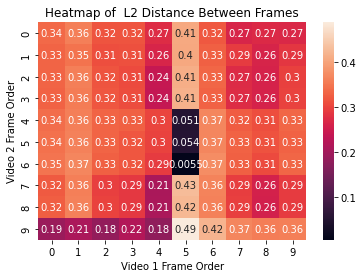

In [175]:
import seaborn as sn

ax = plt.axes()
sn.heatmap(output_match, annot=True, ax=ax)
ax.set_title('Heatmap of  L2 Distance Between Frames')
ax.set_xlabel('Video 1 Frame Order')
ax.set_ylabel('Video 2 Frame Order')

## Visualize Frames from Videos 1 and 2 

In [159]:
vid1_frames = np.array(response.batch.frames.sort_values('id').id)
vid2_frames = np.array(response2.batch.frames.sort_values('id').id)

# Get nearest 3 frames
vid2_nearest = np.argsort(np.array(output_match), axis=1)[:, :3]
vid1_nearest = np.argsort(np.array(output_match), axis=0).T[:, :3]

In [160]:
# Create a list of frames in video 1 ordered by appearance
%matplotlib inline
from matplotlib import pyplot as plt

vid_cap = cv2.VideoCapture('../data/feature_extraction_demo/vid1.mp4')
v1_images = []
while vid_cap.isOpened():
    n = 0
    for f1 in vid1_frames:
        vid_cap.set(cv2.CAP_PROP_POS_FRAMES, f1)
        success, frame = vid_cap.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        v1_images.append(frame)
    vid_cap.release()


### Plot Nearest Neighbors

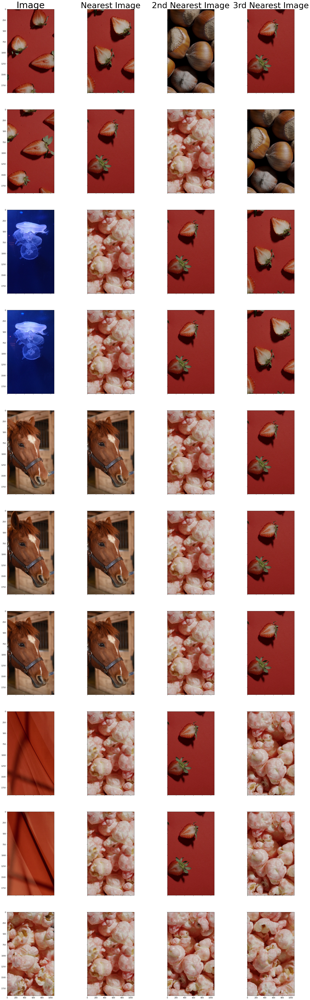

In [172]:
%matplotlib inline
from matplotlib import pyplot as plt

# Plots 
fig, ax = plt.subplots(10,4, sharex=True, sharey=True)
fig.set_size_inches(30.5, 100.5)
ax[0][0].set_title("Image", fontsize=50)
ax[0][1].set_title("Nearest Image", fontsize=45)
ax[0][2].set_title("2nd Nearest Image", fontsize=45)
ax[0][3].set_title("3rd Nearest Image", fontsize=45)
vid_cap = cv2.VideoCapture('../data/feature_extraction_demo/vid2.mp4')
v2_images = []
n = 0
while vid_cap.isOpened():
    for f2 in vid2_frames:
        vid_cap.set(cv2.CAP_PROP_POS_FRAMES, f2)
        success, frame = vid_cap.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        v2_images.append(frame)
        ax[n][0].imshow(frame)
        ax[n][1].imshow(v1_images[vid2_nearest[n][0]])
        ax[n][2].imshow(v1_images[vid2_nearest[n][1]])
        ax[n][3].imshow(v1_images[vid2_nearest[n][2]])
        n+=1
    vid_cap.release()


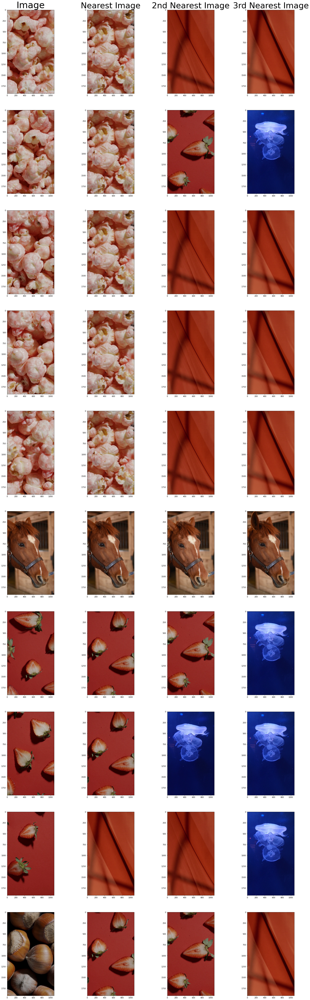

In [171]:
fig, ax = plt.subplots(10,4)
fig.set_size_inches(30.5, 100.5)
vid_cap = cv2.VideoCapture('../data/feature_extraction_demo/vid1.mp4')
ax[0][0].set_title("Image", fontsize=50)
ax[0][1].set_title("Nearest Image", fontsize=45)
ax[0][2].set_title("2nd Nearest Image", fontsize=45)
ax[0][3].set_title("3rd Nearest Image", fontsize=45)
while vid_cap.isOpened():
    n = 0
    for f1 in vid1_frames:
        vid_cap.set(cv2.CAP_PROP_POS_FRAMES, f1)
        success, frame = vid_cap.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax[n][0].imshow(frame)
        ax[n][1].imshow(v2_images[vid1_nearest[n][0]])
        ax[n][2].imshow(v2_images[vid1_nearest[n][1]])
        ax[n][3].imshow(v2_images[vid1_nearest[n][2]])
        n+=1
    vid_cap.release()